# Freddie Mac Mortgage Performance Statistics
    
    Authors: Justin Beer, Anthony Dalton, Harsha Kommanapalli, Hassan Azhar

# Index
This index will take you to the outlined sections as provided in the Grading Rubric for this Lab.

<a id="index"></a>
* <a href="#BU">Business Understanding</a>
* <a href="#DU1">Data Understanding 1</a>
* <a href="#DU2">Data Understanding 2</a>
* <a href="#MEO">Modeling and Evaluation</a>
* <a href="#MESR">Modeling and Evaluation: Summarize the Ramifications</a>
* <a href="#Dep">Deployment</a>
* <a href="#Ex">Exceptional Work</a>
* <a href="#Ref">References</a>

<a id="BU"></a>
<a href="#index">Back to Index</a>
# Business Understanding

    Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How 
    will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for 
    this specific dataset and the stakeholders needs?


This data was collected in order to measure and compare the performance of mortgage loans over thier lifetime. In order to measure performance we created the EverDelinquent response variable. If a loan had ever been delinquent by 30 days or more then the mortgage was flagged as a 1. Otherwise, the response variable was set to 0. Mortgages have had a rocky time in the 2000's. First after the Dotcom bubble in 2001 and then again in 2008 with the housing crisis. During the 2008 housing crisis mortgage companies collectively lost thier minds. They no longer used the tried and true methods on determining whether a mortgage applicant was qualified by looking at their Credit Score, LTV, and whether they were a first time homebuyer, among other factors. Instead, in order to make a quick profit, these mortgage companies looked to generate as many mortgage loans as they could. The reason for this is once the mortgage was provided the underwriting company would quickly wrap up and bundle these mortgages together in what are known as Mortgage Backed Securities (MBS). The companies would then sell off these bundled mortgages to other investors, mainly other banks and large hedgefunds, who in turn were looking for a steady stream of income. At the time, the mortgage market was extremely stable, the main cause of this was that mortgage underwriters employed stringent standards for applicants. With the relaxation of these standards along with selling more balloon payments and variable interest rate mortgages, the mortgage market was due for a collapse. Only a handful of investors took the time to look at the underlying mortgages that were being bundled and sold. They successfully identified that the mortgages being sold were unstable, in that the applicant should have never been approved, and that a collapse would occur. They even invented what are now known as Credit Default Swaps (CDS) in order to hedge against the failure of these mortgages.

The high level purpose of our dataset and classification task is to correctly identify the best features to measure whether a mortgage will become delinquent at some point in its life. Is it still beneficial to judge whether a loan will become delinquent by looking at the applicants Credit Score, LTV, and OrigInterestRate?

In order to measure the effectiveness of our clustering, we will be performing a visual inspection of the plots of our clusters. If we can get the data to be clustered such that there are clear deliniations in the CreditScore, LTV, and OrigInterestRate variables then we will know that using these variables is a good way of being able to classify whether a loan may enter into delinquency.

With this data set, we may not encounter any new or novel ways to predict a loan entering delinquency. However, even a validation of the process mortgage companies have historically classified a low risk mortgage candidate will be a benefit of confirmation in hindsight to the mortgage crisis. It may well be that the industry has already figured out the best way in which to classify a mortgage so as to lower thier risk and exposure to delinquencies.

<a id="DU1"></a>
<a href="#index">Back to Index</a>
# Data Understanding 1

    Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data
    quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these
    problems?

### Data Preparation:

Freddie Mac has made available loan-level credit performance data on a portion of fully amortizing fixed-rate mortgages that the company purchased or guaranteed from 1999 to 2016. We are using the data for Loan-level origination, monthly loan performance, and actual loss data on a portion of the fully amortizing 30-year fixed-rate Single Family mortgages that Freddie Mac acquired with origination dates from 1999 to the Origination Cutoff Date.The Dataset is a “living” dataset, and as such may periodically be corrected or updated over time.

We joined the two files for 1999 Q1 Origination Data File and 1999 Q1 Monthly Performance Data File at http://www.freddiemac.com/research/datasets/sf_loanlevel_dataset.html by 'LOAN SEQUENCE NUMBER' to get our final file with a response variable for 'EverDelinquent' (Has the Loan ever been Delinquent? 0/1). The EverDelinquent field corresponds to never having been 30 days or more delinquent on the loan or having been 30 days or more delinquent on the loan at least once.

We will know if we have mined useful knowledge if we will have a statistically significant way of predicting the outcome variable EverDelinquent. We will take alpha = 0.05 to determine a statistically significant result.

The following table describes the variables that we were provided, will create, and will remove. In the next section we will describe this table in further detail.

| Provided Variables | Removed Variables | Created Variables
| :- | :- | :- 
|Credit Score | FirstPaymentDate | CreditRange
|FirstPaymentDate | MaturityDate | LTV_range
|FirstTimeHomebuyer | MSA | Repay_range
|MaturityDate | Occupancy | IsFirstTime
|MSA | Channel |
|MIP | PPM |
|Units | ProductType |
|Occupancy | PropertyState |
|OCLTV | PropertyType |
|DTI | NumBorrowers |
|OrigUPB | SellerName |
|LTV | ServicerName |
|OrigInterestRate | FirstTimeHomebuyer |
|Channel |  |
|PPM |  |
|ProductType |  |
|PropertyState |  |
|PropertyType |  |
|OrigLoanTerm |  |
|NumBorrowers |  |
|SellerName |  |
|ServicerName |  |
|EverDelinquent |  |
|MonthsDelinquent |  |
|MonthsInRepayment |  |

The following SQL code was used on the Freddie Mac downloaded data sets in order to merge them together. We then output the LoanExport.csv file that we use below.

Using the LoanExport.csv that was output from the SQL code, we now import and modify our dataset as needed.

In [1]:
# Import pandas as numpy and read in the LoanExport Dataset.
import pandas as pd
import numpy as np

# Read in CSV
#df = pd.read_csv(r'C:\Temp\LoanExport.csv', low_memory=False)
df = pd.read_csv('http://erp-id.azurewebsites.net/LoanExport.csv', low_memory=False)




print(df)

# Sometimes Python has errors reading the first column in CSV's so we renamed CreditScore to 'CS'
col_name =df.columns[0]
df=df.rename(columns = {col_name:'CS'})
df.info()
df.shape

        CreditScore  FirstPaymentDate FirstTimeHomebuyer  MaturityDate    MSA  \
0                 0            199902                  N        202901  16974   
1                 0            199902                  N        202901  19740   
2                 0            199902                  N        202901  29940   
3                 0            199902                  N        202901  31084   
4                 0            199902                  N        202901  35644   
5                 0            199902                  N        202901  X       
6                 0            199902                  N        202901  X       
7                 0            199902                  X        202901  36740   
8                 0            199902                  Y        202710  25540   
9                 0            199902                  Y        202901  48620   
10                0            199903                  N        202902  12060   
11                0         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 291451 entries, 0 to 291450
Data columns (total 28 columns):
CS                    291451 non-null int64
FirstPaymentDate      291451 non-null int64
FirstTimeHomebuyer    291451 non-null object
MaturityDate          291451 non-null int64
MSA                   291451 non-null object
MIP                   291451 non-null int64
Units                 291451 non-null int64
Occupancy             291451 non-null object
OCLTV                 291451 non-null int64
DTI                   291451 non-null int64
OrigUPB               291451 non-null int64
LTV                   291451 non-null int64
OrigInterestRate      291451 non-null float64
Channel               291451 non-null object
PPM                   291451 non-null object
ProductType           291451 non-null object
PropertyState         291451 non-null object
PropertyType          291451 non-null object
PostalCode            291451 non-null object
LoanSeqNum            291451 non-null obje

(291451, 28)

In [2]:
# Remove attributes that just are not useful
for col in ['FirstPaymentDate','MaturityDate','MSA',
            'Occupancy','Channel','ProductType','LoanSeqNum',
            'SellerName','PostalCode','ServicerName',
            'PropertyState','PPM','PropertyType','LoanPurpose',
            'NumBorrowers']:
    if col in df:
        del df[col]
# Removing NA's
df.dropna(inplace=True)
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 291451 entries, 0 to 291450
Data columns (total 13 columns):
CS                    291451 non-null int64
FirstTimeHomebuyer    291451 non-null object
MIP                   291451 non-null int64
Units                 291451 non-null int64
OCLTV                 291451 non-null int64
DTI                   291451 non-null int64
OrigUPB               291451 non-null int64
LTV                   291451 non-null int64
OrigInterestRate      291451 non-null float64
OrigLoanTerm          291451 non-null int64
EverDelinquent        291451 non-null int64
MonthsDelinquent      291451 non-null int64
MonthsInRepayment     291451 non-null int64
dtypes: float64(1), int64(11), object(1)
memory usage: 31.1+ MB


(291451, 13)

In [3]:
# Investigate the unique values in the column
df.CS.unique()

array([  0, 335, 342, 363, 366, 370, 375, 391, 396, 445, 462, 466, 471,
       476, 477, 478, 479, 481, 482, 483, 485, 486, 487, 489, 490, 491,
       492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504,
       505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517,
       518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530,
       531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543,
       544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556,
       557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569,
       570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582,
       583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595,
       596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608,
       609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621,
       622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634,
       635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 64

In [4]:
# CS contains a 0 which the data definition states is actually 850.
# Let's convert all 0's to 850
df['CS'] = np.where(df['CS'] == 0, 850, df['CS'])
df.CS.unique()

array([850, 335, 342, 363, 366, 370, 375, 391, 396, 445, 462, 466, 471,
       476, 477, 478, 479, 481, 482, 483, 485, 486, 487, 489, 490, 491,
       492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504,
       505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517,
       518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530,
       531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543,
       544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556,
       557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569,
       570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582,
       583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595,
       596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608,
       609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621,
       622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634,
       635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 64

In [5]:
# Find the values in FirstTimeHomebuyer column
df.FirstTimeHomebuyer.unique()

array(['N', 'X', 'Y'], dtype=object)

In [6]:
# FirstTimeHomebuyer contains X's which stand for unknowns, i.e. Nulls. 
# Need to remove all rows that do not have a valid answer, Y/N, as they are not useful to our research.
df = df[df.FirstTimeHomebuyer != 'X']
df.FirstTimeHomebuyer.unique()

array(['N', 'Y'], dtype=object)

In [7]:
# Check the row and column count of our dataset to see how many rows were just removed.
df.shape

(213436, 13)

In [8]:
# Count values in FirstTimeHomebuyer
df['FirstTimeHomebuyer'].value_counts()

N    184154
Y     29282
Name: FirstTimeHomebuyer, dtype: int64

In [9]:
# Rename FirstTimeHomebuyer to IsFirstTime
df = df.rename(columns = {'FirstTimeHomebuyer':'IsFirstTime'})
# Convert Y/N to 1 or 0 and then count values again to ensure they match
df['IsFirstTime'] = np.where(df['IsFirstTime'] == 'Y', 1, 0)
df['IsFirstTime'].value_counts()

0    184154
1     29282
Name: IsFirstTime, dtype: int64

In [10]:
# Find the values in MIP column
df.MIP.unique()

array([25,  0, 30, 12, 35, 29, 17, 18, 20, 22,  6, 14, 33, 16, 52, 36, 28,
       11, 45, 27, 10, 50, 47,  7, 24, 15, 37, 32, 26,  1, 13, 21, 23, 55,
        4], dtype=int64)

In [11]:
# Find the values in Units column
df.Units.unique()
print('Dataframe shape:', df.shape)
df['Units'].value_counts()

Dataframe shape: (213436, 13)


1    209501
2      3242
3       346
4       345
0         2
Name: Units, dtype: int64

In [12]:
# Units = 0 means that we do not have data on this so it is really a Null value, removing those rows.
df = df[df.Units != 0]
print('Dataframe shape:', df.shape)
df['Units'].value_counts()

Dataframe shape: (213434, 13)


1    209501
2      3242
3       346
4       345
Name: Units, dtype: int64

In [13]:
# Find values in OCLTV
df.OCLTV.unique()
# The OCLTV values check out here.

array([ 89,  73,  75,  76,  78,  90,  95,  80,  77,  85,  93,  70,  74,
        79,  72,  62,  44,  32,  64,  91,  53,  69,  60,  54,  52,  84,
        68,  36,  55,  96,  97,  46,  58,  63,  83,  87,  94,  48,  50,
        51,  67,  86,  81,  66,  71,  82,  88,  26,  59,  57,  61,  30,
        24,  34,  37,  42,  65,  31, 100,   7,  38,  39,  16,  41,  33,
        92,  40,  35,  56,  22,  28,  43,  47,  49,  98,  29,  45,  25,
       103,  10,  18,  23,  20,  15, 102, 101,  14,  21,  27, 105,  19,
         8,   0, 104,  17, 110,  99,  12,   6,  13,   9,  11], dtype=int64)

In [14]:
# Find values in DTI
df.DTI.unique()
# The DTI values check out here.

array([27, 17, 16, 14, 18, 40, 21, 38, 19, 23, 45, 28, 29, 15, 43, 25, 24,
       26, 20, 35, 46, 39, 33, 48, 30, 31, 22, 56, 32, 12,  6, 37, 36, 42,
       34, 11, 41,  8, 44, 55,  0, 51, 10,  7, 47,  9, 13, 65, 54,  2, 53,
       57,  5,  3,  4, 50, 59, 49, 52, 64, 60, 58,  1, 61, 62, 63], dtype=int64)

In [15]:
# Find values in OrigUPB
df.OrigUPB.unique()
# The OrigUPB values check out here.

array([117000, 109000,  88000, 160000, 207000, 111000,  55000,  35000,
       126000, 200000,  70000,  93000,  79000,  54000,  80000, 231000,
       145000, 187000, 148000,  90000,  65000,  86000, 122000, 157000,
        94000,  63000,  50000, 100000, 191000, 204000, 222000, 189000,
        57000, 202000, 137000,  56000, 140000,  18000,  76000,  77000,
       151000, 118000, 182000,  98000,  89000, 172000,  82000, 240000,
       102000, 173000,  51000, 169000, 101000, 152000, 141000,  47000,
       128000, 133000, 135000, 115000, 144000, 146000, 212000, 176000,
       214000, 190000, 227000,  99000,  83000,  49000,  29000, 124000,
       132000, 150000, 300000,  95000, 149000, 162000, 226000, 110000,
       112000, 219000, 236000,  67000, 195000, 164000, 198000,  60000,
       194000, 147000, 104000,  72000, 183000, 154000, 179000,  66000,
       210000,  46000,  96000, 225000, 156000,  45000, 235000, 113000,
       139000,  74000,  68000,  69000, 238000, 142000,  73000,  48000,
      

In [16]:
# Find values in LTV
df.LTV.unique()
# The LTV values check out here.

array([ 89,  73,  75,  76,  78,  90,  95,  80,  77,  85,  93,  70,  74,
        79,  72,  62,  44,  32,  64,  91,  53,  69,  60,  54,  52,  84,
        68,  36,  55,  96,  97,  46,  58,  63,  83,  87,  94,  48,  50,
        51,  67,  86,  81,  66,  71,  82,  88,  26,  59,  57,  61,  30,
        24,  34,  37,  42,  65,  31,   7,  38,  39,  16,  41,  33,  92,
        40,  35,  56,  22,  28,  43,  47, 100,  49,  98,  29,  45,  25,
        10,  18,  23,  20,  15, 103,  14,  21,  27,  19,   8,   0,  17,
        12,   6,  13,   9,  11], dtype=int64)

In [17]:
# Find values in OrigInterestRate
df.OrigInterestRate.unique()
# The values check out here since we see that pandas imported this column as a float type.

array([  6.75 ,   6.5  ,   6.875,   7.125,   7.   ,   7.25 ,   6.625,
         7.75 ,   7.2  ,   7.5  ,   7.625,   7.875,   6.25 ,   8.125,
         7.15 ,   7.375,   6.375,   8.75 ,   7.1  ,   7.05 ,   6.95 ,
         8.   ,   8.625,   8.375,   8.5  ,   6.125,   6.   ,   5.875,
         8.25 ,   8.99 ,   5.625,   9.   ,   5.125,   5.25 ,   9.125,
         6.99 ,   5.375,   8.365,   8.875,   6.975,   7.3  ,   7.313,
         9.625,   9.25 ,   5.75 ,   7.85 ,   8.695,   4.875,   7.775,
         7.29 ,   7.405,   9.5  ,   9.375,   9.75 ,   7.13 ,   5.99 ,
         6.999,   7.055,   7.09 ,   6.785,   7.08 ,   7.025,   7.7  ,
         7.58 ,  10.5  ,   7.55 ,   7.445,   9.875,   6.85 ,   6.925,
         6.9  ,   8.37 ,   7.095,   7.19 ,   7.456,   7.675,   9.675,
         7.475,   7.22 ,   7.17 ,   8.7  ,   7.301,   8.9  ,  10.   ,
         5.5  ,   6.62 ,   7.325,  10.375,   7.8  ,   7.4  ,  10.85 ,
         7.185,   7.245,  11.5  ,   6.94 ,   6.87 ,   7.65 ,   7.312,
         7.28 ,   7.

In [18]:
# Find values in OrigLoanTerm
df.OrigLoanTerm.unique()
# The OrigLoanTerm values check out here.

array([360, 345, 306, 335, 322, 327, 358, 355, 356, 354, 346, 344, 348,
       313, 316, 353, 319, 332, 336, 338, 312, 328, 351, 333, 359, 331,
       337, 334, 357, 330, 350, 341, 343, 325, 326, 324, 347, 352, 329,
       339, 309, 317, 349, 342, 304, 310, 340, 301, 305, 315, 323, 321,
       320, 302, 314, 318, 308, 303, 307, 361, 311], dtype=int64)

In [19]:
# Find values in EverDelinquent
df.EverDelinquent.unique()
# The EverDelinquent values check out here.

array([0, 1], dtype=int64)

In [20]:
# Find values in MonthsInRepayment
df.MonthsInRepayment.unique()
# The MonthsInRepayment values check out here.

array([ 52, 144,  67,  35,  54,  42,  44,  64, 212,  37,  47,  53,  55,
        66,  26,  38,  36,  39,  40,  11, 176,  46, 197, 210,  56, 118,
        63,  24,  28,  91,  50,  22, 211, 199,  23,  30, 125,  41,  76,
        49,  18,  19,  43,  60,  83,  95,  29,  45,  13,   6,  48,  62,
        14,  15, 111,  51,  17,  75,  58,  27,  10,  31, 133, 165, 156,
        33,  68, 205,  57, 159,  81, 191, 194, 114,  59, 100, 134, 128,
        71,   7,  65,  74,  79, 174, 195, 151,  34, 149,  21,  12, 137,
       130,  69,  70, 173, 166,  61, 160,  20, 178,   3,  72, 147,   2,
        32, 164, 139, 108, 148,  92, 209, 102,  87,  94,  73, 123,  16,
       142,   1, 172, 109, 141, 175, 103, 168,   5, 155, 177, 158, 138,
        25, 110,  98,  84, 136,   8, 121, 179,   4, 154, 161, 157, 150,
        80, 170,  77,   9, 183,  93, 143, 162, 126,  89, 208, 184,  82,
       145, 117, 101, 122, 107, 193,  85,  78, 169, 104, 131, 140, 163,
       112, 206, 135, 132, 124, 186, 127, 189, 190, 198, 192, 16

In [21]:
# Create new variable for Credit Range since that is commonly what is looked at in the industry.
# New values = Poor (0-650), Fair (650-700), Good (700-750), Excellent (750-900)
df['CreditRange'] = pd.cut(df.CS,[550,650,700,750,1e6],4,labels=[1,2,3,4])
df.CreditRange.unique()

[4.0, NaN, 1.0, 2.0, 3.0]
Categories (4, int64): [1 < 2 < 3 < 4]

In [22]:
df['CreditRange'].value_counts()

3    72678
4    57183
2    54763
1    28284
Name: CreditRange, dtype: int64

In [23]:
# Create new variable for LTV Range
df['LTV_range'] = pd.cut(df.LTV,[0,25,50,1000],3,labels=['Low','Medium','High'])
df.LTV_range.unique()

[High, Medium, Low, NaN]
Categories (3, object): [High < Low < Medium]

In [24]:
# We get a NaN null return as a possible value
# Checking to ensure this is accurate
print('Is there a Null value in LTV?', df['LTV_range'].isnull().values.any())
print('Dataframe shape:', df.shape)
df['LTV_range'].value_counts()

Is there a Null value in LTV? True
Dataframe shape: (213434, 15)


High      198868
Medium     13202
Low         1361
Name: LTV_range, dtype: int64

In [25]:
# We need to find where these 3 Nan values are.
inds = pd.isnull(df).any(1).nonzero()[0]
pd.isnull(df).any(1).nonzero()[0]

array([   985,    986,    987,    988,    989,    990,    991,    992,
          993,    994,    995,    996,    997,    998,    999,   1000,
         1001,   1002,   1003,   1004,   1005,   1006,   1007,   1008,
         1009,   1010,   1011,   1012,   1013,   1014,   1015,   1016,
         1017,   1018,   1019,   1020,   1021,   1022,   1023,   1024,
         1025,   1026,   1027,   1028,   1029,   1030,   1031,   1032,
         1033,   1034,   1035,   1036,   1037,   1038,   1039,   1040,
         1041,   1042,   1043,   1044,   1045,   1046,   1047,   1048,
         1049,   1050,   1051,   1052,   1053,   1054,   1055,   1056,
         1057,   1058,   1059,   1060,   1061,   1062,   1063,   1064,
         1065,   1066,   1067,   1068,   1069,   1070,   1071,   1072,
         1073,   1074,   1075,   1076,   1077,   1078,   1079,   1080,
         1081,   1082,   1083,   1084,   1085,   1086,   1087,   1088,
         1089,   1090,   1091,   1092,   1093,   1094,   1095,   1096,
      

In [26]:
# Drop the specific rows with Nan for LTV_range as this will be an issue later on.
# I was unable to find a different way to get rid of these Nan's.
indexes_to_keep = set(range(df.shape[0])) - set(inds)
df = df.take(list(indexes_to_keep))
print('Is there a Null value in LTV?', df['LTV_range'].isnull().values.any())
print('Dataframe shape:', df.shape)
df['LTV_range'].value_counts()

Is there a Null value in LTV? False
Dataframe shape: (212905, 15)


High      198358
Medium     13186
Low         1361
Name: LTV_range, dtype: int64

In [27]:
# Create new variable Repay range
df['Repay_range'] = pd.cut(df.MonthsInRepayment,[0,48,96,144,192,240],5,
                           labels=['0-4yrs','4-8yrs','8-12yrs', '12-16yrs', '16-20yrs'])
print('Dataframe shape:', df.shape)
print('Repay_range values:', df.Repay_range.unique())
df['Repay_range'].value_counts()

Dataframe shape: (212905, 16)
Repay_range values: [4-8yrs, 8-12yrs, 0-4yrs, 16-20yrs, 12-16yrs]
Categories (5, object): [0-4yrs < 12-16yrs < 16-20yrs < 4-8yrs < 8-12yrs]


0-4yrs      108653
4-8yrs       73488
8-12yrs      13885
12-16yrs      8728
16-20yrs      8151
Name: Repay_range, dtype: int64

In [28]:
# Final check of our dataframe before moving on.
print('Dataframe shape:', df.shape)
print('Are there any null values in our dataframe (T/F)?', df.isnull().values.any())
df.info()

Dataframe shape: (212905, 16)
Are there any null values in our dataframe (T/F)? False
<class 'pandas.core.frame.DataFrame'>
Int64Index: 212905 entries, 0 to 291450
Data columns (total 16 columns):
CS                   212905 non-null int64
IsFirstTime          212905 non-null int32
MIP                  212905 non-null int64
Units                212905 non-null int64
OCLTV                212905 non-null int64
DTI                  212905 non-null int64
OrigUPB              212905 non-null int64
LTV                  212905 non-null int64
OrigInterestRate     212905 non-null float64
OrigLoanTerm         212905 non-null int64
EverDelinquent       212905 non-null int64
MonthsDelinquent     212905 non-null int64
MonthsInRepayment    212905 non-null int64
CreditRange          212905 non-null category
LTV_range            212905 non-null category
Repay_range          212905 non-null category
dtypes: category(3), float64(1), int32(1), int64(11)
memory usage: 22.5 MB


In [29]:
# Now that we have created the variables we want to investigate further let's group our dataframe by these ranges.
df_grouped = df.groupby(by=['CreditRange'])
df_grouped = df.groupby(by=['CreditRange','LTV_range'])
df_grouped = df.groupby(by=['Repay_range'])
df_grouped = df.groupby(by=['CreditRange','IsFirstTime','LTV_range','Repay_range'])
df_grouped.describe()

CS                         \
                                                 count        mean        std   
CreditRange IsFirstTime LTV_range Repay_range                                   
1           0           High      0-4yrs       11450.0  626.529956  19.843510   
                                  12-16yrs       909.0  625.511551  19.916542   
                                  16-20yrs      1177.0  625.493628  20.070331   
                                  4-8yrs        8280.0  627.101691  19.639019   
                                  8-12yrs       1279.0  626.274433  20.232272   
                        Low       0-4yrs          17.0  627.529412  19.824599   
                                  12-16yrs         2.0  608.000000  35.355339   
                                  16-20yrs         1.0  631.000000        NaN   
                                  4-8yrs          13.0  635.384615  13.859644   
                                  8-12yrs          3.0  637.333333   7.094599   
                        Medium    0-4yrs         286.0  624.125874  20.164018   
                                  12-16yrs        39.0  624.128205  24.192408   
                                  16-20yrs        47.0  619.085106  26.227955   
                                  4-8yrs         210.0  626.152381  19.763085   
                                  8-12yrs         50.0  624.380000  23.455464   
            1           High      0-4yrs        2253.0  625.074567  20.676969   
                                  12-16yrs       187.0  625.336898  19.827722   
                                  16-20yrs       222.0  624.815315  18.847738   
                                  4-8yrs        1599.0  625.818637  19.879100   
                                  8-12yrs        227.0  624.312775  19.971306   
                        Low       8-12yrs          1.0  596.000000        NaN   
                        Medium    0-4yrs           7.0  631.571429  12.488090   
                                  12-16yrs         3.0  629.333333   6.027714   
                                  16-20yrs         4.0  616.500000  16.842407   
                                  4-8yrs          16.0  621.125000  15.239751   
                                  8-12yrs          1.0  639.000000        NaN   
2           0           High      0-4yrs       22976.0  677.335306  14.428621   
                                  12-16yrs      1649.0  677.235294  14.628795   
                                  16-20yrs      1939.0  675.659103  14.436539   
                                  4-8yrs       15655.0  676.947684  14.440027   
...                                                ...         ...        ...   
4           0           High      0-4yrs       21770.0  771.096785  16.729990   
                                  12-16yrs      2025.0  775.115556  17.963305   
                                  16-20yrs      1402.0  774.682596  18.945351   
                                  4-8yrs       14609.0  771.910398  16.944185   
                                  8-12yrs       3469.0  773.554338  16.923832   
                        Low       0-4yrs         334.0  777.943114  17.064259   
                                  12-16yrs        73.0  782.082192  14.416188   
                                  16-20yrs        49.0  783.040816  19.201735   
                                  4-8yrs         235.0  777.893617  15.562438   
                                  8-12yrs        105.0  779.438095  15.772373   
                        Medium    0-4yrs        2871.0  775.854406  16.458555   
                                  12-16yrs       448.0  779.410714  16.650401   
                                  16-20yrs       307.0  777.895765  17.064532   
                                  4-8yrs        2285.0  775.845077  16.568163   
                                  8-12yrs        704.0  777.308239  16.119050   
            1           High      0-4yrs        3064.0  771.980418  20.469600   
  

In [30]:
df_imputed = df_grouped.transform(lambda grp: grp.fillna(grp.median()))
df_imputed[['IsFirstTime','EverDelinquent']] = df[['IsFirstTime','EverDelinquent']]
df.dropna(inplace=True)

In [31]:
# Slicing the CreditScore
df_imputed['CreditRange'] = pd.cut(df_imputed.CS,[550,650,700,750,1e6],4,labels=[1,2,3,4]) # this creates a new variable
df_imputed.CreditRange.describe()

count     212905
unique         4
top            3
freq       72678
Name: CreditRange, dtype: int64

In [32]:
# Slicing the LTV
df_imputed['LTV_range'] = pd.cut(df_imputed.LTV,[0,25,50,110],3,labels=['low','medium','high']) # this creates a new variable
df_imputed.LTV_range.describe()

count     212905
unique         3
top         high
freq      198358
Name: LTV_range, dtype: object

In [33]:
# Taking slices of the MonthsInRepayment
df_imputed['Repay_range'] = pd.cut(df_imputed.MonthsInRepayment,[0,48,96,144,192,240],5,labels=['0-4yrs','4-8yrs','8-12yrs', '12-16yrs', '16-20yrs'])
df_imputed.Repay_range.describe()

count     212905
unique         5
top       0-4yrs
freq      108653
Name: Repay_range, dtype: object

In [34]:
df_imputed.head()
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 212905 entries, 0 to 291450
Data columns (total 16 columns):
CS                   212905 non-null int64
MIP                  212905 non-null int64
Units                212905 non-null int64
OCLTV                212905 non-null int64
DTI                  212905 non-null int64
OrigUPB              212905 non-null int64
LTV                  212905 non-null int64
OrigInterestRate     212905 non-null float64
OrigLoanTerm         212905 non-null int64
EverDelinquent       212905 non-null int64
MonthsDelinquent     212905 non-null int64
MonthsInRepayment    212905 non-null int64
IsFirstTime          212905 non-null int32
CreditRange          212905 non-null category
LTV_range            212905 non-null category
Repay_range          212905 non-null category
dtypes: category(3), float64(1), int32(1), int64(11)
memory usage: 22.5 MB


In [35]:
# Now let's clean up the dataset
#store for regression
df_imputed_reg = df_imputed

#store for classification of credit score - Task 2
df_imputed_cs = df_imputed

if 'FirstTimeHomebuyer' in df_imputed_cs:
    del df_imputed_cs['FirstTimeHomebuyer']
        
for col in ['LTV_range', 'Repay_range']:
    if col in df_imputed_cs:
        del df_imputed_cs[col]
        
df_imputed_cs = df_imputed_cs.sample(10000)
df_imputed_cs.info()
df_imputed_cs.head()

if 'FirstTimeHomebuyer' in df_imputed_reg:
    del df_imputed_reg['FirstTimeHomebuyer']
        
for col in ['CreditRange','LTV_range', 'Repay_range']:
    if col in df_imputed_reg:
        del df_imputed_reg[col]
        
df_imputed_reg = df_imputed_reg.sample(10000)
df_imputed_reg.info()
df_imputed_reg.head()

if 'FirstTimeHomebuyer' in df_imputed:
    del df_imputed['FirstTimeHomebuyer'] # if 'FirstTimeHomebuyer' column still exists, delete it (as we created an IsFirstTime column)

#Removing Ranges: they are represented by their constituent variables anyway and 'MonthsDelinquent' as it is highly correlated to 'EverDelinquent', in fact we made 'Everdelinquent' from 'MonthsDelinquent' 
for col in ['CreditRange','LTV_range', 'Repay_range','MonthsDelinquent']:
    if col in df_imputed:
        del df_imputed[col]  


df_imputed = df_imputed.sample(10000)
df_imputed.info()
df_imputed.head()

df_imputed_cs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 148615 to 162201
Data columns (total 14 columns):
CS                   10000 non-null int64
MIP                  10000 non-null int64
Units                10000 non-null int64
OCLTV                10000 non-null int64
DTI                  10000 non-null int64
OrigUPB              10000 non-null int64
LTV                  10000 non-null int64
OrigInterestRate     10000 non-null float64
OrigLoanTerm         10000 non-null int64
EverDelinquent       10000 non-null int64
MonthsDelinquent     10000 non-null int64
MonthsInRepayment    10000 non-null int64
IsFirstTime          10000 non-null int64
CreditRange          10000 non-null category
dtypes: category(1), float64(1), int64(12)
memory usage: 1.1 MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 225903 to 220758
Data columns (total 13 columns):
CS                   10000 non-null int64
MIP                  10000 non-null int64
Units                10000 no

In [36]:
df_imputed_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 225903 to 220758
Data columns (total 13 columns):
CS                   10000 non-null int64
MIP                  10000 non-null int64
Units                10000 non-null int64
OCLTV                10000 non-null int64
DTI                  10000 non-null int64
OrigUPB              10000 non-null int64
LTV                  10000 non-null int64
OrigInterestRate     10000 non-null float64
OrigLoanTerm         10000 non-null int64
EverDelinquent       10000 non-null int64
MonthsDelinquent     10000 non-null int64
MonthsInRepayment    10000 non-null int64
IsFirstTime          10000 non-null int64
dtypes: float64(1), int64(12)
memory usage: 1.1 MB


We made these corrections to the raw dataset:

* Missing character representation of variables were replaced with 'X'.
* Missing variables in integer columns were replaced with '0'.
* Missing variables in floating length fields were replaced with '0.00'.
* Ignored data where current loan deliquncy status is 'R' = REO Acquisition as we are concerned with delinquencies.
* Ignored all non-numeric mortgage insurance premium fields as they weren't meaningful per the data element      dictionary specifications. 

You may download the finalized dataset here:

* https://drive.google.com/open?id=0B3IRH2wZKQh3dmIyQ0pHOE44Z2M

This table is a full disclosure of the variables that were provided, removed, or created along with their definitions and values.

| Variables | Modified? | Definition | Values
| :- | :- | :- | :- | :- 
| CreditScore | Yes, renamed to CS | A number summarizing the borrower’s creditworthiness. | 301-850, 0 if 850 
| MIP | No | The % of loss coverage on the loan. | 1-55%, 0 = No MIP
| Units | No | Shows whether the mortgage is a 1,2,3, or 4 unit property. | 1-4 units, X = Unknown
| OCLTV | No | Original Combined Loan-to-Value ratio [Reference LTV for calculation] | 0-200%, X = Unknown
| DTI | No | Original Debt-to-Income ratio. | 0-65%, X = >65 or Unknown
| OrigUPB | No | The unpaid balance of the mortgage on the note date. | Numeric rounded to nearest 1,000
| LTV | No | The Loan to Value ratio [orig mortgage amount / (lesser of appraised value or purchase price)] | 6-105%, X = Unknown
| OrigInterestRate | No | The original note rate as indicated on the mortgage note. | Numeric
| OrigLoanTerm | No | The number of scheduled monthly payments based on the FirstPaymentDate and MaturityDate. | Integer
| EverDelinquent | No | Has the loan has ever been 30 days or more delinquent? | 0 = No, 1 = Yes
| MonthsInRepayment | No | The number of months that the Loan premium has been paid. | Integer
| CreditRange | Created | Made this from CreditScore (CS). | Bad, Good, Very Good, Excellent
| LTV_range | Created | Made this from LTV. | Low, Medium, High
| Repay_range | Created | Made this from MonthsInRepayment. | 0-4yrs, 4-8yrs, 8-12yrs, 12-16yrs, 16-20yrs
| IsFirstTime | Created | Is the purchaser a First Time Homebuyer? | Y or N
| FirstTimeHomebuyer | Removed | Not necessary as we created IsFirstTime variable from this one. |
| MonthsDelinquent | Removed | Not necessary, highly correlated to EverDelinquent |
| FirstPaymentDate | Removed | Not necessary. |
| MaturityDate | Removed | Not necessary. |
| MSA | Removed | Not necessary. |
| Occupancy | Removed | Not necessary. |
| Channel | Removed | Not necessary. |
| PPM | Removed | Not necessary. |
| ProductType | Removed | Not necessary. |
| PropertyState | Removed | Not necessary. |
| PropertyType | Removed | Not necessary. |
| NumBorrowers | Removed | Not necessary. |
| SellerName | Removed | Not necessary. |
| ServicerName | Removed | Not necessary. |


We made these corrections to the raw dataset:

* Missing character representation of variables were replaced with 'X'.
* Missing variables in integer columns were replaced with '0'.
* Missing variables in floating length fields were replaced with '0.00'.
* Ignored data where current loan deliquncy status is 'R' = REO Acquisition as we are concerned with delinquencies.
* Ignored all non-numeric mortgage insurance premium fields as they weren't meaningful per the data element      dictionary specifications. 

You may download the finalized dataset here:

* https://drive.google.com/open?id=0B3IRH2wZKQh3dmIyQ0pHOE44Z2M

<a id="DU2"></a>
<a href="#index">Back to Index</a>
# Data Understanding 2

    Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or
    graphs.



<a id="MEO"></a>
<a href="#index">Back to Index</a>
# Modeling and Evaluation

    Different tasks will require different evaluation methods. Be as thorough as possible when analyzing the data 
    you have chosen and use visualizations of the results to explain the performance and expected outcomes whenever 
    possible. Guide the reader through your analysis with plenty of discussion of the results.

For this project we have chosen "Option A: Cluster Analysis". We will be clustering mainly upon the EverDelinquent, CreditScore, LTV, and OrgInterestRate variables.

Option A: Cluster Analysis
* Train: Perform cluster analysis using several clustering methods (adjust parameters).
* Eval: Use internal and/or external validation measures to describe and compare the clusterings and the clusters— how did you determine a suitable number of clusters for each method?
* Visualize: Use tables/visualization to discuss the found results. Explain each visualization in detail.
* Summarize: Describe your results. What findings are the most interesting and why?

Our goal here is to explore clustering for all combinations of variables in our dataset and then choose those variables whose interactions are both useful for the business and their combinations have high accuracy clusters

### K-Means Clustering

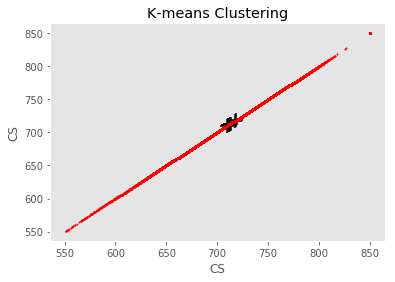

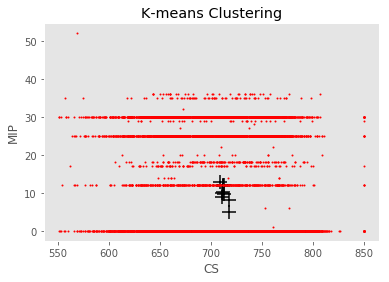

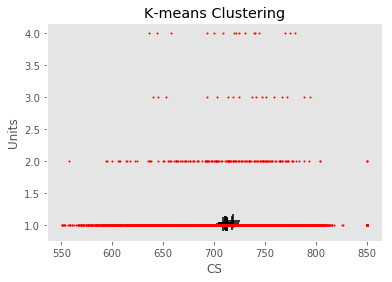

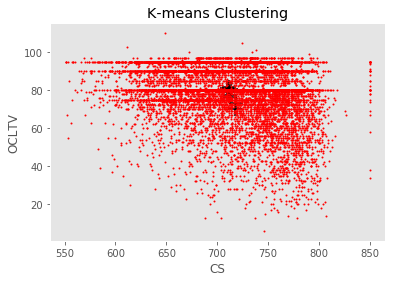

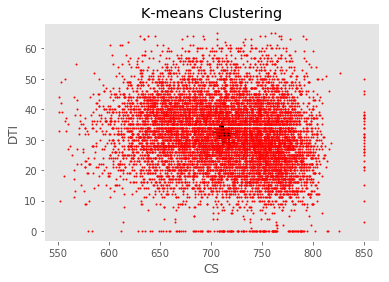

...

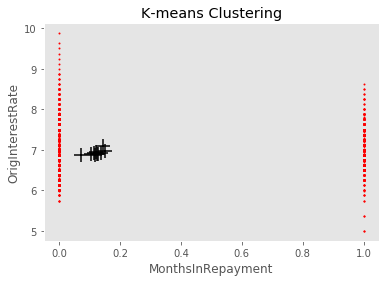

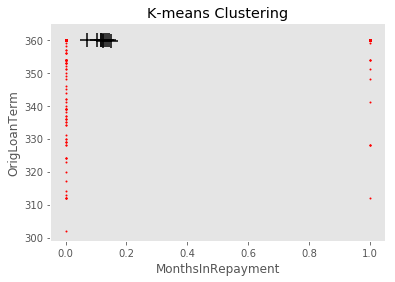

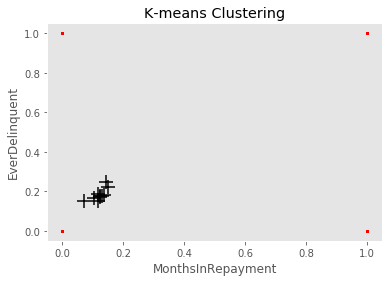

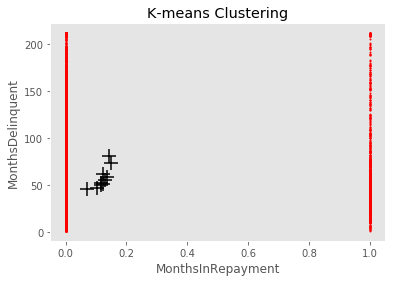

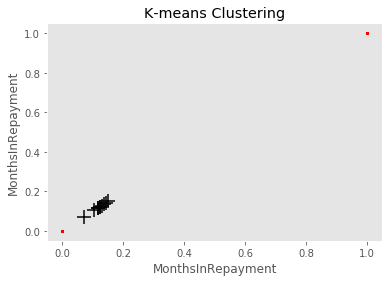

In [75]:
%matplotlib inline
import time
import matplotlib.pyplot as plt
import numpy as np
from __future__ import print_function
# KMeans import
from sklearn.cluster import KMeans

# Convert Dataframe to Matrix for KMeans
mat = df_imputed.as_matrix()


# KMeans running
kmeans = KMeans(init='random', n_clusters=10, n_init=1, n_jobs=-1)
kmeans.fit(mat)
for x in range(0, 12):
 # Visualization of all grid combinations
    for y in range(0, 12):
# Plotting
        centroids = kmeans.cluster_centers_
        plt.plot(mat[:, x], mat[:, y], 'r.', markersize=2) #plot the data
        plt.scatter(centroids[:, x], centroids[:, y],
            marker='+', s=200, linewidths=3, color='k')  # plot the centroids
        plt.title('K-means Clustering')
        plt.xlabel(choices.get(x, 'default') )
        plt.ylabel(choices.get(y, 'default') )
        plt.grid()
        plt.show()

### K-Means Mini-Batch Clustering

Time for BatchKMeans:
CPU times: user 377 ms, sys: 10.8 ms, total: 388 ms
Wall time: 210 ms
Time for MiniBatchKMeans:
CPU times: user 266 ms, sys: 2.29 ms, total: 268 ms
Wall time: 142 ms


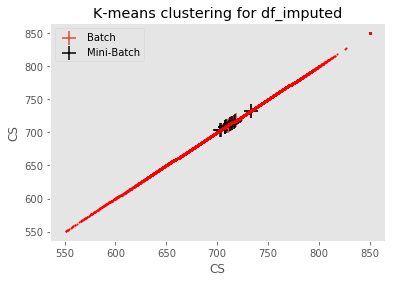

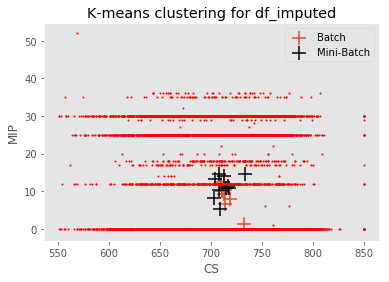

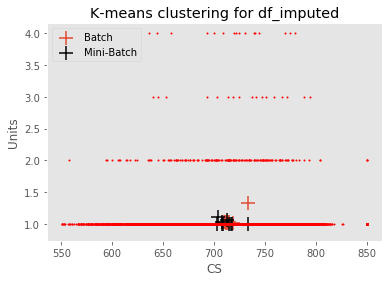

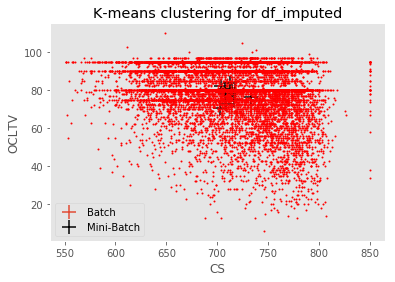

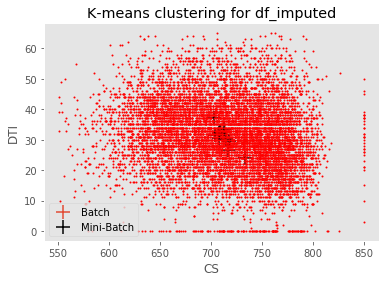

...

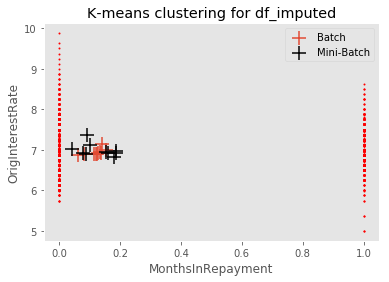

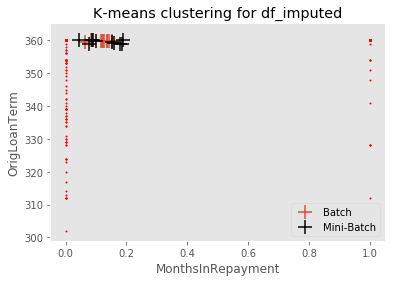

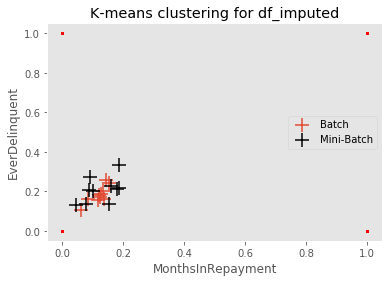

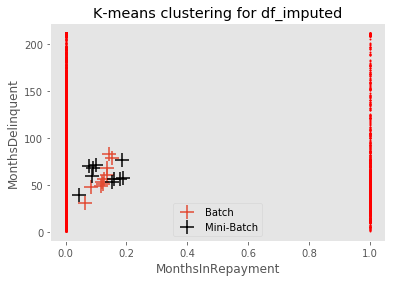

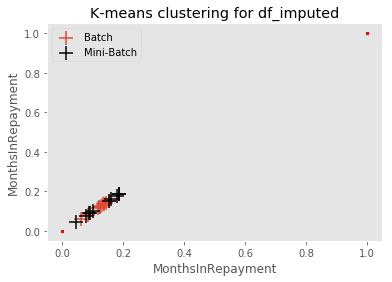

In [73]:
from sklearn.cluster import MiniBatchKMeans
kmeans_mini = MiniBatchKMeans(n_clusters=10, batch_size=10)
kmeans = KMeans(n_clusters=10)
print('Time for BatchKMeans:')
%time kmeans.fit(mat)
print('Time for MiniBatchKMeans:')
%time kmeans_mini.fit(mat)
choices = {0: 'CS', 1 : 'MIP', 2: 'Units', 3: 'OCLTV', 4: 'DTI', 5 : 'OrigUPB',6: 'LTV', 7 : 'OrigInterestRate', 8 : 'OrigLoanTerm',9: 'EverDelinquent',10: 'MonthsDelinquent', 11: 'MonthsInRepayment', 12: 'IsFirstTime'}
#result = choices.get(key, 'default')

for x in range(0, 12):
 # Visualization of all grid combinations
    for y in range(0, 12):
        centroids = kmeans.cluster_centers_
        plt.plot(mat[:, x], mat[:, y], 'r.', markersize=2) #plot the data
        plt.scatter(centroids[:, x], centroids[:, y], marker='+', s=200, linewidths=3, label='Batch')  # plot the centroids
        centroids = kmeans_mini.cluster_centers_
        plt.scatter(centroids[:, x], centroids[:, y], marker='+', s=200, linewidths=3, color='k',label='Mini-Batch')  # plot the centroids
        plt.legend()
        plt.title('K-means clustering for df_imputed')
        plt.xlabel(choices.get(x, 'default') )
        plt.ylabel(choices.get(y, 'default') )
        plt.grid()
        plt.show()
    
             

Looking at the above graphs for K-Means and Mini-Batch clustering, we already know that we need EverDelinquent in our graphs as it is our response variable. We also see that CS, LTV, and OrigInterestRate need to be explored further. Most of the other variables do not make business sense to try to cluster on.

### DBSCAN

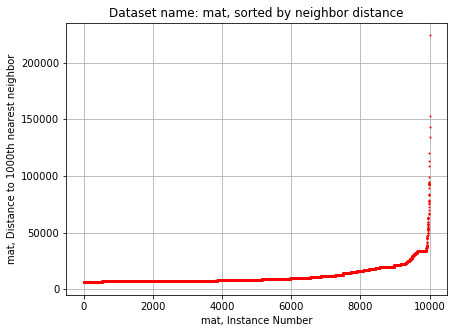

In [39]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import kneighbors_graph

mat_N = 1000 # Adjust Minpts

# Create Graphs
mat_knn_graph = kneighbors_graph(mat, mat_N, mode='distance') # Calc nearest neighbor distance

N2 = mat_knn_graph.shape[0]
mat_4nn_distances = np.zeros((N2,1))
for i in range(N2):
    mat_4nn_distances[i] = mat_knn_graph[i,:].max()

mat_4nn_distances = np.sort(mat_4nn_distances, axis=0)
# Plot Graphs
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(N2), mat_4nn_distances, 'r.', markersize=2)
plt.title('Dataset name: mat, sorted by neighbor distance')
plt.xlabel('mat, Instance Number')
plt.ylabel('mat, Distance to {0}th nearest neighbor'.format(mat_N))
plt.grid()
plt.show()

### This is straight from github notebook 09 Clustering and Discretization

In [86]:
# Create a baseline for comparison
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
y = df_imputed['EverDelinquent']
X = df_imputed[['CS','LTV','OrigInterestRate']]
cv = StratifiedKFold(n_splits=10)
clf = RandomForestClassifier(n_estimators=150,random_state=1)
acc = cross_val_score(clf,X,y=y,cv=cv)
print ("Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

Average accuracy =  76.62 +- 0.845931439302


Initial RandomForestClassifier based clustering model for Everdelinquent vs CS, LTV, OrigInterestRate has an average accuracy of 76.62 with an error of +/- 0.84 which means we are going down the right path as the accuracy is reasonably high.

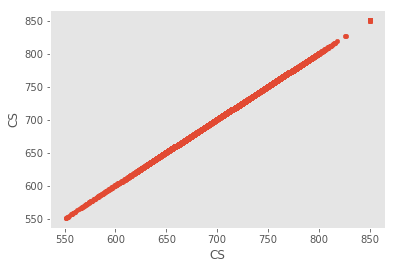

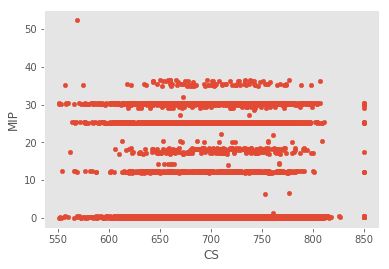

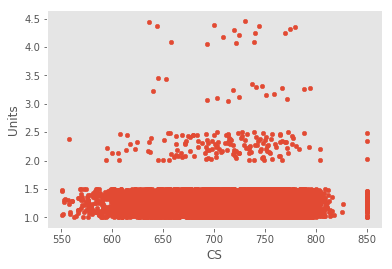

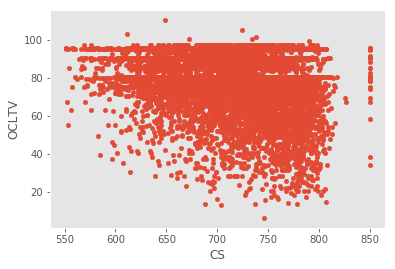

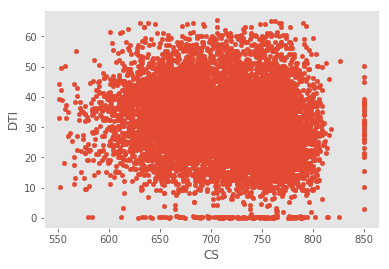

...

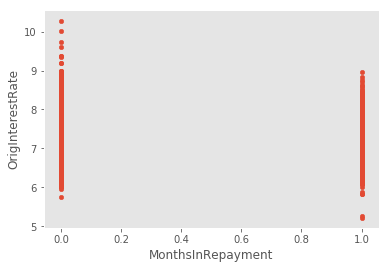

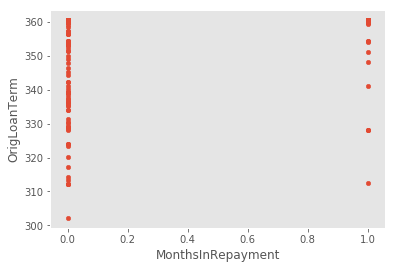

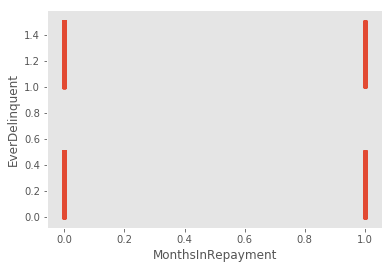

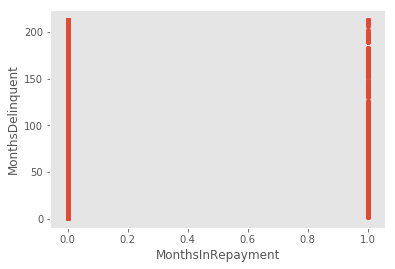

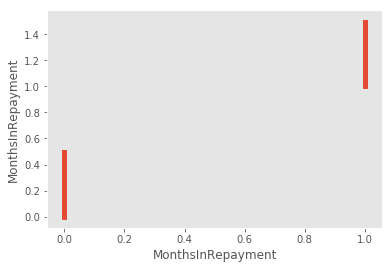

In [87]:
from matplotlib import pyplot as plt
plt.style.use("ggplot")
%matplotlib inline
X1 = df_imputed.values
choices = {0: 'CS', 1 : 'MIP', 2: 'Units', 3: 'OCLTV', 4: 'DTI', 5 : 'OrigUPB',6: 'LTV', 7 : 'OrigInterestRate', 8 : 'OrigLoanTerm',9: 'EverDelinquent',10: 'MonthsDelinquent', 11: 'MonthsInRepayment', 12: 'IsFirstTime'}

for x in range(0, 12):
  # Visualization of all grid combinations
        for y in range(0, 12):


            plt.scatter(X1[:, x], X1[:, y]+np.random.random(X1[:, x].shape)/2, 
             s=20)
            plt.xlabel(choices.get(x, 'default') )
            plt.ylabel(choices.get(y, 'default') )
            plt.grid()
           
            plt.show()

Looking at above graphs [eyeballing] and knowing that we need'EverDelinquent' in our graphs[ which is the response variable for regressions and classifications ], we see that CS, LTV / OCLTV, OrigInterestRate, Everdelinquent need to be explored further.
We will add MIP too to it as the variable is of interest to us [we want to see if there are any clusters created by Mortage insurance premium]

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
X1 = df_imputed[['CS','LTV','OrigInterestRate','MIP','DTI','EverDelinquent']]
cls = KMeans(n_clusters=8, init='k-means++',random_state=1)
cls.fit(X1)
newfeature = cls.labels_
y = df_imputed['EverDelinquent']
X = df_imputed[['CS','LTV','OrigInterestRate','MIP','DTI']]
X = np.column_stack((X,pd.get_dummies(newfeature)))
acc = cross_val_score(clf,X,y=y,cv=cv)
print ("Average accuracy (with kmeans for X/EverDelinquent)= ", acc.mean(), "+-", acc.std())

Accuracy has increased just a bit higher to .78 from .76 with above changes

In [46]:
%%time 
X1 = df_imputed[['CS','LTV','EverDelinquent']]
X2 = df_imputed[['OrigInterestRate','MIP','DTI','EverDelinquent']]
params = []
for n_fare in range(4,10):
    for n_fam in range(16,19):
        # get the first clustering
        cls_fare = KMeans(n_clusters=n_fare, init='k-means++',random_state=1)
        cls_fare.fit(X1)
        newfeature_fare = cls_fare.labels_ # the labels from kmeans clustering
        # append on the second clustering
        cls_fam = KMeans(n_clusters=n_fam, init='k-means++',random_state=1)
        cls_fam.fit(X2)
        newfeature_fam = cls_fam.labels_ # the labels from kmeans clustering
        y = df_imputed['EverDelinquent']
        X = df_imputed[['CS']]
        X = np.column_stack((X,pd.get_dummies(newfeature_fare),pd.get_dummies(newfeature_fam)))
        acc = cross_val_score(clf,X,y=y,cv=cv)
        params.append((n_fare,n_fam,acc.mean()*100,acc.std()*100)) # save state
        print ("Clusters",n_fare,n_fam,"Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

Clusters 4 16 Average accuracy =  76.24 +- 0.926498785752
Clusters 4 17 Average accuracy =  76.28 +- 1.16172285852
Clusters 4 18 Average accuracy =  75.86 +- 1.05185550338
Clusters 5 16 Average accuracy =  76.06 +- 0.969742233792
Clusters 5 17 Average accuracy =  76.33 +- 1.20917327129
Clusters 5 18 Average accuracy =  75.77 +- 1.04503588455
Clusters 6 16 Average accuracy =  75.94 +- 0.905759349938
Clusters 6 17 Average accuracy =  76.22 +- 1.12676528168
Clusters 6 18 Average accuracy =  75.56 +- 1.12
Clusters 7 16 Average accuracy =  75.93 +- 0.878692210049
Clusters 7 17 Average accuracy =  76.12 +- 1.21144541767
Clusters 7 18 Average accuracy =  75.73 +- 0.93600213675
Clusters 8 16 Average accuracy =  75.71 +- 0.982293235241
Clusters 8 17 Average accuracy =  75.54 +- 1.13771701227
Clusters 8 18 Average accuracy =  75.23 +- 1.21330128163
Clusters 9 16 Average accuracy =  75.59 +- 0.93107464792
Clusters 9 17 Average accuracy =  75.77 +- 1.0724271537
Clusters 9 18 Average accuracy =  75

Average accuracy is hovering around the same for the Everdelinquent vs CS clustering which is most important to us

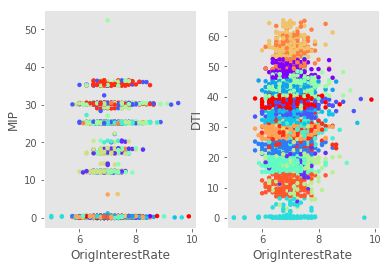

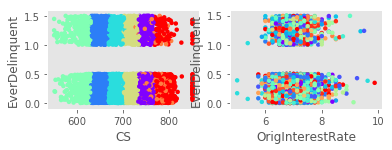

In [108]:
n_fare=7
d_fam=17
X1 = df_imputed[['CS','LTV','EverDelinquent']]
X2 = df_imputed[['OrigInterestRate','MIP','DTI','EverDelinquent']]
cls_fare = KMeans(n_clusters=n_fare, init='k-means++',random_state=1)
cls_fare.fit(X1)
newfeature_fare = cls_fare.labels_
# Append 2nd clustering
cls_fam = KMeans(n_clusters=n_fam, init='k-means++',random_state=1)
cls_fam.fit(X2)
newfeature_fam = cls_fam.labels_
plt.figure()
plt.subplot(1,2,1)
X2=X2.values
X1=X1.values
plt.scatter(X2[:, 0], X2[:, 1]+np.random.random(X2[:, 1].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('OrigInterestRate'), plt.ylabel('MIP')
plt.grid()
plt.subplot(1,2,2)
plt.scatter(X2[:, 0], X2[:, 2]+np.random.random(X2[:, 2].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('OrigInterestRate'), plt.ylabel('DTI')
plt.grid()

plt.figure()
plt.subplot(2,2,1)
plt.scatter(X1[:, 0], X1[:, 2]+np.random.random(X1[:, 2].shape)/2, c=newfeature_fare, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('CS'), plt.ylabel('EverDelinquent')
plt.grid()
plt.subplot(2,2,2)
plt.scatter(X2[:, 0], X2[:, 3]+np.random.random(X2[:, 3].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('OrigInterestRate'), plt.ylabel('EverDelinquent')
plt.grid()






Using K-Means clustering for Everdelinquent vs CS, we can observe that clusters of Everdelinquent appear to be clearly delineated with vertical lines based upon the Credit Score (CS). We did not provide any information to the algorithm about desirable Credit Ranges and the algorithm actually generated these on its own. It has found that between 550 and 800 there are around 6 clusters of mortgage applicants. Since the clusters are not separated by the EverDelinquent variable, meaning the same color exists for EverDelinquent ranges of 0.0-0.5 and 1.0-1.5, there must be another set of variable clusters that we can use in conjunction with CS to completely classify the EveryDelinquent outcome.

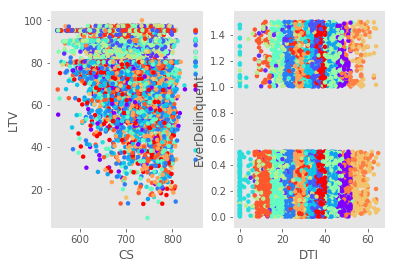

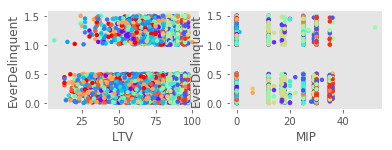

In [121]:
n_fare=7
d_fam=17
X1 = df_imputed[['CS','LTV','EverDelinquent']]
X2 = df_imputed[['OrigInterestRate','MIP','DTI','EverDelinquent']]
cls_fare = KMeans(n_clusters=n_fare, init='k-means++',random_state=1)
cls_fare.fit(X1)
newfeature_fare = cls_fare.labels_
# Append 2nd clustering
cls_fam = KMeans(n_clusters=n_fam, init='k-means++',random_state=1)
cls_fam.fit(X2)
newfeature_fam = cls_fam.labels_
plt.figure()
plt.subplot(1,2,1)
X2=X2.values
X1=X1.values
plt.scatter(X1[:, 0], X1[:, 1]+np.random.random(X1[:, 1].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('CS'), plt.ylabel('LTV')
plt.grid()
plt.subplot(1,2,2)
plt.scatter(X2[:, 2], X2[:, 3]+np.random.random(X2[:, 3].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('DTI'), plt.ylabel('EverDelinquent')
plt.grid()

plt.figure()

plt.subplot(2,2,1)
plt.scatter(X1[:, 1], X1[:, 2]+np.random.random(X1[:, 2].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('LTV'), plt.ylabel('EverDelinquent')
plt.grid()
plt.subplot(2,2,2)
plt.scatter(X2[:, 1], X2[:, 3]+np.random.random(X2[:, 3].shape)/2, c=newfeature_fam, cmap=plt.cm.rainbow, s=20, linewidths=0)
plt.xlabel('MIP'), plt.ylabel('EverDelinquent')
plt.grid()



Using K-Means clustering for DTI vs Everdelinquent, we observe that there are clusters of DTI that are clearly delineated. It appears that there are around 10 clusters for DTI. We must continue to look at other variables to see if we can find a stronger set for EverDelinquent clustering.

In [111]:
# Clustering one set of attributes
params = []
for n_fam in range(15,20):
    # Append clustering
    cls_fam = KMeans(n_clusters=n_fam, init='k-means++',random_state=1)
    cls_fam.fit(X2)
    newfeature_fam = cls_fam.labels_
    y = df_imputed['EverDelinquent']
    X = df_imputed[['CS','DTI']]
    X = np.column_stack((X,pd.get_dummies(newfeature_fam)))
    acc = cross_val_score(clf,X,y=y,cv=cv)
    params.append((n_fare,n_fam,acc.mean()*100,acc.std()*100)) # save state
    print ("Clusters",n_fam,"Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

Clusters 15 Average accuracy =  74.68 +- 1.40484874631
Clusters 16 Average accuracy =  74.5 +- 1.30996183151
Clusters 17 Average accuracy =  74.79 +- 1.18359621493
Clusters 18 Average accuracy =  74.63 +- 1.41
Clusters 19 Average accuracy =  74.57 +- 1.31988635874


The clustering accuracy of EverDelinquent vs CS/DTI is around 75%

### Agglomerative Clustering

In [112]:
%%time 
from sklearn.cluster import AgglomerativeClustering
X1 = df_imputed[['CS','DTI']]
params = []
for link in ['ward', 'complete', 'average']:
    for n_fam in range(13,20):
        cls_fam = AgglomerativeClustering(n_clusters=n_fam, linkage=link)
        cls_fam.fit(X2)
        newfeature_fam = cls_fam.labels_
        y = df_imputed['EverDelinquent']
        X = df_imputed[['CS','DTI']]
        X = np.column_stack((X,pd.get_dummies(newfeature_fam)))
        acc = cross_val_score(clf,X,y=y,cv=cv)
        params.append((n_fare,n_fam,acc.mean()*100,acc.std()*100))
        print ("C=",n_fam,link,"Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

C= 13 ward Average accuracy =  74.79 +- 1.4306991298
C= 14 ward Average accuracy =  74.96 +- 1.24915971757
C= 15 ward Average accuracy =  74.86 +- 1.45478520751
C= 16 ward Average accuracy =  74.8 +- 1.43387586631
C= 17 ward Average accuracy =  74.69 +- 1.5623379916
C= 18 ward Average accuracy =  74.85 +- 1.47054411699
C= 19 ward Average accuracy =  74.73 +- 1.29154945705
C= 13 complete Average accuracy =  74.77 +- 1.41566238913
C= 14 complete Average accuracy =  74.89 +- 1.62015431364
C= 15 complete Average accuracy =  74.79 +- 1.58395075681
C= 16 complete Average accuracy =  74.82 +- 1.49452333538
C= 17 complete Average accuracy =  74.83 +- 1.69177421661
C= 18 complete Average accuracy =  74.94 +- 1.47390637423
C= 19 complete Average accuracy =  74.95 +- 1.46509385365
C= 13 average Average accuracy =  74.89 +- 1.64951508026
C= 14 average Average accuracy =  74.99 +- 1.52279348567
C= 15 average Average accuracy =  74.9 +- 1.58429795178
C= 16 average Average accuracy =  75.04 +- 1.4987

The clustering accuracy of EverDelinquent vs CS/DTI is around 75%

### DBSCAN

In [113]:
%%time 
from sklearn.cluster import DBSCAN
params = []
for eps in [0.1, 0.125, 0.15]:
    for mpts in range(5,8):
        cls_fam = DBSCAN(eps=eps, min_samples=mpts)
        cls_fam.fit(X2)
        newfeature_fam = cls_fam.labels_ 
        y = df_imputed['EverDelinquent']
        X = df_imputed[['CS','DTI']]
        X = np.column_stack((X,pd.get_dummies(newfeature_fam)))
        acc = cross_val_score(clf,X,y=y,cv=cv)
        params.append((n_fare,n_fam,acc.mean()*100,acc.std()*100))
        print (eps,mpts,"Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

0.1 5 Average accuracy =  83.62 +- 1.02156742313
0.1 6 Average accuracy =  81.9 +- 0.794984276574
0.1 7 Average accuracy =  80.45 +- 1.25717938259
0.125 5 Average accuracy =  92.55 +- 0.757957782465
0.125 6 Average accuracy =  91.56 +- 0.726911273815
0.125 7 Average accuracy =  90.83 +- 0.586600375042
0.15 5 Average accuracy =  92.55 +- 0.757957782465
0.15 6 Average accuracy =  91.56 +- 0.726911273815
0.15 7 Average accuracy =  90.83 +- 0.586600375042
CPU times: user 11min 58s, sys: 5.31 s, total: 12min 3s
Wall time: 12min 8s


The clustering accuracy of EverDelinquent vs CS/DTI using DB scan is at least 80%

### Cluster Visualization

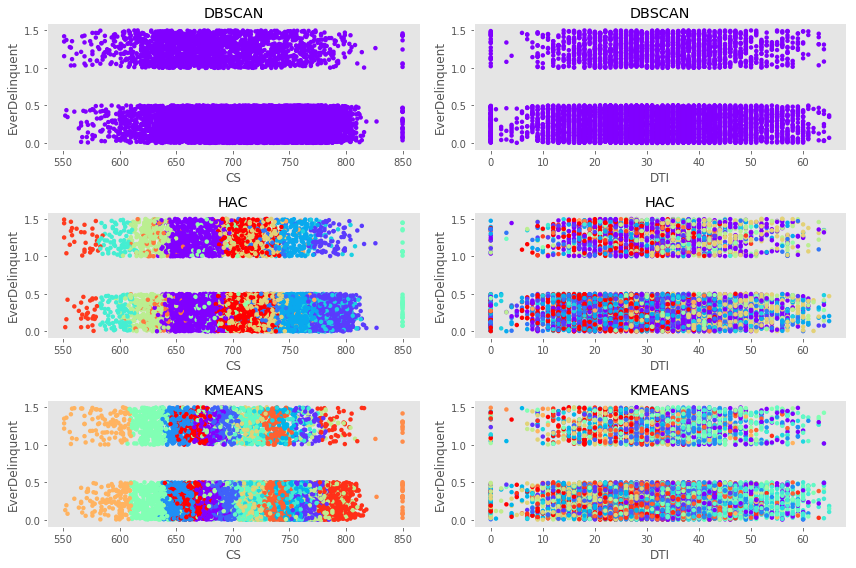

In [122]:
X1 = df_imputed[['CS','LTV','DTI','EverDelinquent']]
data = X1
cls = DBSCAN(eps=0.125, min_samples=6)
cls.fit(data)
dbs_labels = cls.labels_ 
cls = AgglomerativeClustering(n_clusters=14, linkage='complete')
cls.fit(data)
hac_labels = cls.labels_ 
cls = KMeans(n_clusters=17, random_state=1)
cls.fit(data)
kmn_labels = cls.labels_
fig = plt.figure(figsize=(12,8))
title = ['DBSCAN','HAC','KMEANS']
for i,l in enumerate([dbs_labels,hac_labels,kmn_labels]):
    plt.subplot(3,2,2*i+1)
    plt.scatter(data.values[:, 0], data.values[:, 3]+np.random.random(data.values[:, 3].shape)/2, c=l, cmap=plt.cm.rainbow, s=20, linewidths=0)
    plt.xlabel('CS'), plt.ylabel('EverDelinquent')
    plt.grid()
    plt.title(title[i])
   
    plt.subplot(3,2,2*i+2)
    plt.scatter(data.values[:, 2], data.values[:, 3]+np.random.random(data.values[:, 3].shape)/2, c=l, cmap=plt.cm.rainbow, s=20, linewidths=0)
    plt.xlabel('DTI'), plt.ylabel('EverDelinquent')
    plt.grid()
    plt.title(title[i])

plt.tight_layout()
plt.show()

From above it is evident that the only clear clustering we observe is using KMEANS and HAC for EverDelinquent vs CS with around 7 to 10 clusters of EverDelinquent based on credit range, the cluster does not imply or cause delinquency of 0 or 1 necessarily, it just shows that borrowers in a particular credit range have similar characteristics.

Estimated number of clusters: 144
Silhouette Coefficient: 0.302


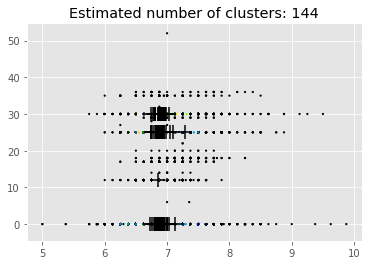

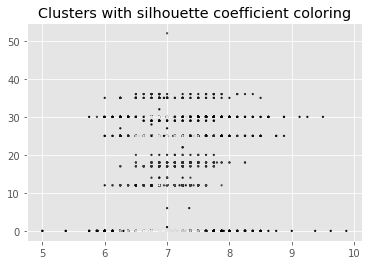

In [123]:
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
import numpy as np

data = X2
n_clusters = 2
model = KMeans(init='k-means++', n_clusters=n_clusters, n_init=1).fit(data)
# model = AgglomerativeClustering(linkage='ward', n_clusters=n_clusters).fit(data)
model = DBSCAN(eps=0.15, min_samples=10).fit(data)

labels = model.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(data, labels))

silhouette_per_sample = metrics.silhouette_samples(data,labels)

# get the middle of each cluster
centroids = []
for lab in range(0,n_clusters_):
    centroids.append( [np.mean(data[np.where(labels==lab),0]), np.mean(data[np.where(labels==lab),1])] )
centroids = np.array(centroids)

plt.figure()
plt.scatter(data[:, 0], data[:, 1], c=labels,
                    cmap=plt.cm.spectral, s=5, linewidths=0)

if len(centroids)>0:
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='+', s=200, linewidths=3, color='k', zorder=10)  # plot the centroids
plt.title('Estimated number of clusters: %d' % n_clusters_)

plt.figure()
plt.scatter(data[:, 0], data[:, 1], c=silhouette_per_sample,
                cmap=plt.cm.gray, s=5, linewidths=0)
plt.title('Clusters with silhouette coefficient coloring')
plt.show()

<a id="MESR"></a>
<a href="#index">Back to Index</a>
# Modeling and Evaluation: Summarize the Ramifications

After running all of the above clustering methods, we are able to conclude that the best methods for clustering were the K-Means and HAC. Interestingly, when using K-Means to cluster the Credit Score (CS), we found that the algorithm automatically recreated the credit ranges which are in common use today. This also occurred with K-Means clustering on the DTI (Debt-to-Income) variable. There were clear vertical deliniations of the clusters, when plotted against EverDelinquent.

We can conclude that the tried and true methods of evaluating a mortgage applicants risk of default or delinquency on a mortgage loan are verifiable via our K-Means clustering. The clustering successfully recreated the ranges that are in use today for the Credit Score. While Credit Score alone is not necessarily the best predictor of EverDelinquent, we can conclude that the applicants Credit Score should be an integral part of the mortgage application process as it currently is.

<a id="Dep"></a>
<a href="#index">Back to Index</a>
# Deployment

    Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you 
    achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for 
    interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model 
    for interested parties? What other data should be collected? How often would the model need to be updated, etc.?
    

After trying to find clustering results or interactions between all combinations of variables that we marked as potentially useful interactions, there was nothing jumping out at us. However, for the K-Means clustering model to be able to find credit range demarcations itself was very interesting. This model does not imply causation and our classification model has been the most useful for us yet, which was covered in Lab 2. Our end goal for these analyzes that we perform is to be able to predict and/or classify delinquencies in the mortgage world. This clustering model has not helped for that, the only thing it has helped for is to be able to create credit range clusters. Unfortunately, we did not acheive our desired goals of successful clustering around EverDelinquent.

We believe that while there is potential in this data set we would need to collect more variables on the mortgages. There are too many confounding factors affecting our data such as macro economic situations, deaths, divorces, and other circumstances that affect an individuals life that may cause them to become delinquent on their mortgage.

However, we believe we can conclude that the mortgage industry is headed in the correct direction if they limit mortgage availability to those borrowers that have the most desirable Credit Scores as the Credit Score was the only variable to successfully cluster against EverDelinquent. At best our findings are a validation of the current processes for applicant approval and if an underwriter stays true to this process then their risk will be lowered.

### Model Deployment

If there were any interested parties, then this model could easily be deployed as it would only need to be updated and re-ran once a month as that is the frequency of finding out whether a loan has become delinquent. Also, the run-time for our data set did not exceed 10 minutes for any particular clustering. Most mortgage companies would not have as many mortgages to cluster on as we do in our data set. Therefore, it would be cheap, efficient, and would need low overhead to employ our K-Means clustering model.

<a id="Ex"></a>
<a href="#index">Back to Index</a>
# Exceptional Work

    You have free reign to provide additional analyses or combine analyses.
    
We have decided to utilize the Gaussian Mixture model and Spectral Clustering for this section. Please reference the course github notebook "11 More Clustering".

In [53]:
# Let's create the Gaussian Mixture Model
import itertools
import numpy as np
from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn import mixture
X = df_imputed[["CS","OrigInterestRate"]]

lowest_bic = np.infty
bic = []
n_components_range = range(7, 17)
cv_types = ['spherical', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a mixture of Gaussians with EM
        gmm = mixture.GaussianMixture(n_components=n_components, covariance_type=cv_type)
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

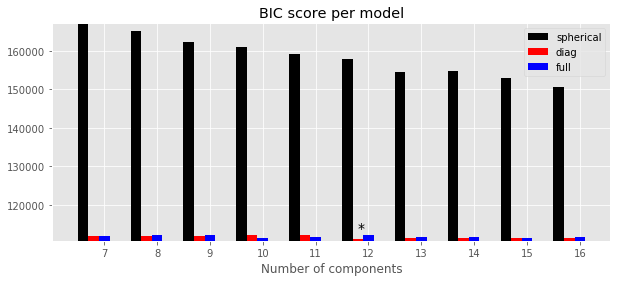

In [54]:
# Plot the Bayesian Information Criterion
bic = np.array(bic)
color_iter = itertools.cycle(['k', 'r', 'b', 'g', 'c', 'm', 'y'])
clf = best_gmm
bars = []
plt.figure(figsize=(10,4))
spl = plt.subplot(1,1,1)
# Plot the BIC scores
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.min(n_components_range)-0.4 + np.mod(bic.argmin(), len(n_components_range)) +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)
plt.show()

NameError: name 'Y_' is not defined

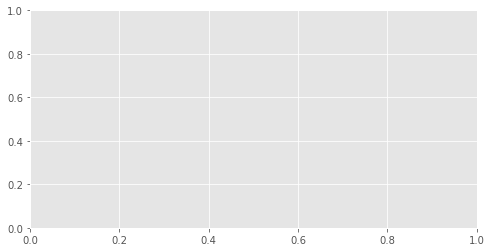

In [55]:
# Plot the winner
plt.figure(figsize=(8,4))
splot = plt.subplot(1,1,1)
#X1 = X.as_matrix(columns= ["EverDelinquent"])
X1 = df_imputed[["CS","OrigInterestRate"]]
X1 = np.asarray(X1)
Y_New = clf.predict(X1)

for i, (mean, covar, color) in enumerate(zip(clf.means_, clf.covariances_, color_iter)):
    if len(covar.shape)<2:
        tmp = np.zeros((2,2))
        np.fill_diagonal(tmp,covar)
        covar = tmp
    elif covar.shape[0] != covar.shape[1]:
        covar = np.diag(covar)
        
    v, w = linalg.eigh(covar)
    if not np.any(Y_New == i):
        continue
    plt.scatter(X1[Y_ == i, 0], X1[Y_ == i, 1], .8, color=color)
    # Plot an ellipse to show the Gaussian component
    angle = np.arctan2(w[0][1], w[0][0])
    angle = 180 * angle / np.pi  # convert to degrees
    v *= 4
    ell = mpl.patches.Ellipse(mean, v[0], v[1], 180 + angle, color=color)
    ell.set_clip_box(splot.bbox)
    ell.set_alpha(.5)
    splot.add_artist(ell)
    
plt.title('Selected GMM')
plt.show()

### Spectral Clustering

In [ ]:
# an example using SpectralClustering, which assumes that the graphical data needs to be calculated from the structure
from sklearn.cluster import SpectralClustering
X = df_imputed[["CS","OrigInterestRate"]]
X = np.asarray(X)
nclust = 10
# If a string, this may be one of 
#  ‘nearest_neighbors’, ‘precomputed’, ‘rbf’ 
#  or one of the kernels supported by sklearn.metrics.pairwise_kernels
spc = SpectralClustering(n_clusters=nclust, affinity = 'nearest_neighbors')
labels = spc.fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
                    cmap=plt.cm.rainbow, s=5, linewidths=0)
plt.show()

In [ ]:
# an example using precomputed affinity, which uses the actual proximity graph
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import kneighbors_graph
X = df_imputed[["CS","OrigInterestRate"]]
X = np.asarray(X)
nclust = 3
Xknn = kneighbors_graph(X, 10) 
spc = SpectralClustering(n_clusters=nclust, affinity = 'precomputed')
labels = spc.fit_predict(Xknn) 
plt.scatter(X[:, 0], X[:, 1], c=labels,
                    cmap=plt.cm.rainbow, s=5, linewidths=0)
plt.show()

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances
X = df_imputed[["CS","OrigInterestRate"]]
X = np.asarray(X)
nclust = 4
d = pairwise_distances(X, metric='euclidean')
d = np.exp(- d**2 / (2.* 0.1**2)) # convert from euclidean distance to similarity
# this is Eric's function, empirically it works
spc = SpectralClustering(n_clusters=nclust, affinity = 'precomputed', eigen_solver = 'arpack')
labels = spc.fit_predict(d) 
plt.scatter(X[:, 0], X[:, 1], c=labels,
                    cmap=plt.cm.rainbow, s=5, linewidths=0)
plt.show()

<a id="Ref"></a>
<a href="#index">Back to Index</a>
# References

In completing our work we referenced the course notebooks and scikit learn documentation located below.
* https://github.com/eclarson/DataMiningNotebooks
* http://scikit-learn.org/stable/supervised_learning.html#supervised-learning